# CF Visual Analysis 

### Get data from folds 

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
from scipy.stats import gaussian_kde
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
import torch
import torchxrayvision as xrv
import sys

In [2]:
plt.rcParams.update({
    'font.size': 17,
    'axes.linewidth': 1.2,
    'axes.titlesize': 18,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 15,
})


In [66]:
CF_COUNT = 16
DISEASE = 'pneumothorax'

In [80]:
def organ_colours(delta_col):
    if "Heart" in delta_col:
        # coral red
        return '#ba6146'
    elif "Left Hilus Pulmonis" in delta_col or "Right Hilus Pulmonis" in delta_col:
        # soft blue
        return "#6e84b7"
    elif "Left Scapula" in delta_col:
        # light green
        return "#79AA79"
    elif "Right Scapula" in delta_col:
        # light green, slightly different
        return "#5c8a5c"
    elif "Spine" in delta_col:
        # purple
        return "#9b59b6"

    elif "Left Lung" in delta_col:
        # yellow
        return "#f1c40f"
    elif "Right Lung" in delta_col:
        # yellow, slighly different
        return "#f39c12"
    elif "Facies Diaphragmatica" in delta_col:
        # light blue
        return "#467275"
    elif "Mediastinum" in delta_col:
        # light pink
        return "#e994b0"
    else:
        return 'gray'

In [68]:
# ── CONFIG ────────────────────────────────────────────────────────────────────
DATA_DIR     = "/zhome/d0/a/221493/thesis/data/"
PROB_COL     = f"{DISEASE}_prob"

# ── LOAD SEGMENTATION MODEL ───────────────────────────────────────────────────
print("Loading PSPNet segmentation model...")
seg_model = xrv.baseline_models.chestx_det.PSPNet()
seg_model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
seg_model.to(device)
transform = xrv.datasets.XRayResizer(224)



def load_image_gray(img_path):
    """Load image as grayscale numpy array."""
    img = Image.open(os.path.join(DATA_DIR, img_path)).convert("L")
    return np.array(img)

def overlay_mask_on_image(ax, img_np, mask, title, feature_text):
    if mask.shape != img_np.shape:
        from PIL import Image as PILImage
        mask_pil = PILImage.fromarray(mask * 255).resize(
            (img_np.shape[1], img_np.shape[0]), PILImage.NEAREST
        )
        mask = (np.array(mask_pil) > 0).astype(np.uint8)

    ax.imshow(img_np, cmap='gray')
    ax.contour(mask, levels=[0.5], colors='red', linewidths=1.5)
    ax.set_title(title, fontsize=9)
    ax.axis('off')

    if feature_text:
        ax.set_xlabel(feature_text, fontsize=9, family='monospace', loc='left')

Loading PSPNet segmentation model...


In [69]:
def plot_sample_image(sample, title, overlay_organs=None):
    """
    Plot an X-ray image with optional segmentation overlays.
    
    Parameters
    ----------
    sample : pd.Series
    title : str
    overlay_organs : list of str, 'all', or None
        e.g. ['Heart', 'Left Lung'] or 'all'
    """
    img_path = sample['path']
    img_np   = load_image_gray(img_path)

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(img_np, cmap='gray')

    if overlay_organs is not None:
        # Resolve which organs to overlay
        organs_to_plot = seg_model.targets if overlay_organs == 'all' else overlay_organs

        # One forward pass for all organs at once
        img_pil = Image.open(os.path.join(DATA_DIR, img_path)).convert("L")
        img_np_norm = (np.array(img_pil).astype(np.float32) / 255.0) * 2048 - 1024
        img_tensor  = torch.from_numpy(transform(img_np_norm[None])).unsqueeze(0).to(device)

        with torch.no_grad():
            seg_out = seg_model(img_tensor).cpu().numpy()
        seg_out = 1 / (1 + np.exp(-seg_out))  # sigmoid

        # Use function "organ_colours" to assign colors based on organ name
        colors = [organ_colours(organ) for organ in organs_to_plot]

        for i, organ in enumerate(organs_to_plot):
            if organ not in seg_model.targets:
                print(f"[WARN] '{organ}' not in seg_model.targets, skipping")
                continue
            idx  = seg_model.targets.index(organ)
            mask = (seg_out[0, idx] >= 0.5).astype(np.uint8)

            # Resize mask to match original image size
            mask_resized = np.array(
                Image.fromarray(mask * 255).resize(
                    (img_np.shape[1], img_np.shape[0]), Image.NEAREST
                )
            ) > 0

            color = colors[i % len(colors)]
            ax.contour(mask_resized, levels=[0.5], colors=[color], linewidths=1.5)
            # fill the contour for better visibility
            ax.contourf(mask_resized, levels=[0.5, 1], colors=[color], alpha=0.3)
            # Small legend patch
            ax.plot([], [], color=color, label=organ, linewidth=1.5)

        ax.legend(fontsize=7, loc='lower right', framealpha=0.6)

    ax.set_title(title, fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [70]:
# Load c2 data
CF_COUNT = 16
cf16_fold0_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/{DISEASE}/cv_results/cf_{CF_COUNT}/fold_0_predictions.csv")
cf16_fold1_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/{DISEASE}/cv_results/cf_{CF_COUNT}/fold_1_predictions.csv")
cf16_fold2_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/{DISEASE}/cv_results/cf_{CF_COUNT}/fold_2_predictions.csv")
cf16_fold3_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/{DISEASE}/cv_results/cf_{CF_COUNT}/fold_3_predictions.csv")
cf16_fold4_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/{DISEASE}/cv_results/cf_{CF_COUNT}/fold_4_predictions.csv")


In [71]:
cf16_merged_data = pd.concat([cf16_fold0_data, cf16_fold1_data, cf16_fold2_data, cf16_fold3_data, cf16_fold4_data], ignore_index=True)
cf16_merged_data

,path,pneumothorax_prob,pneumothorax_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,RF_B1_prob,RF_B2_prob,RF_B4_prob,RF_M3_prob,RF_M6_prob,MLP_B1_prob,MLP_B2_prob,MLP_B4_prob,MLP_M3_prob,MLP_M6_prob
0,CheXpert-v1.0-small/train/patient00005/study2/...,0.660463,1.0,-0.001128,0.002570,0.005626,0.004502,0.158625,0.046703,0.004803,...,0.715,0.580,0.520,0.690,0.705,0.654857,0.512032,0.457099,9.999999e-01,1.000000e+00
1,CheXpert-v1.0-small/train/patient00011/study6/...,0.114553,1.0,-0.001080,0.010193,0.002775,0.005226,0.092086,0.203557,0.005814,...,0.990,0.765,0.805,0.705,0.610,0.892504,0.776712,0.917745,5.977359e-07,9.909184e-09
2,CheXpert-v1.0-small/train/patient00025/study2/...,0.015564,1.0,-0.001109,0.008478,0.004507,0.008881,0.003306,0.262712,0.004831,...,1.000,0.895,0.905,0.845,0.760,0.962547,0.935160,0.977727,1.433992e-02,2.435366e-03
3,CheXpert-v1.0-small/train/patient00029/study1/...,0.163620,0.0,-0.001138,0.008044,0.005021,0.004424,0.199522,0.195586,0.005605,...,0.955,0.740,0.790,0.870,0.900,0.836618,0.750706,0.869572,1.000000e+00,1.000000e+00
4,CheXpert-v1.0-small/train/patient00039/study7/...,0.514162,1.0,-0.001178,0.000573,0.005629,0.003592,0.048183,0.318329,0.004088,...,0.860,0.665,0.545,0.560,0.525,0.516184,0.656591,0.535095,9.847120e-01,9.993655e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27717,CheXpert-v1.0-small/train/patient47299/study4/...,0.076877,0.0,-0.001089,0.005022,0.002142,0.003862,0.040614,0.246367,0.004457,...,0.995,0.785,0.840,0.865,0.835,0.926812,0.722818,0.908263,1.000000e+00,9.999897e-01
27718,CheXpert-v1.0-small/train/patient47299/study1/...,0.094715,0.0,-0.001121,0.008399,0.000745,0.002379,-0.040860,0.217676,0.004273,...,1.000,0.790,0.840,0.770,0.855,0.910697,0.791799,0.616284,1.000000e+00,9.999892e-01
27719,CheXpert-v1.0-small/train/patient47301/study2/...,0.474702,1.0,-0.001131,0.007142,0.004829,0.004963,0.083047,-0.364383,0.004641,...,0.120,0.800,0.795,0.740,0.765,0.454635,0.869151,0.796061,1.733015e-02,7.056089e-01
27720,CheXpert-v1.0-small/train/patient47301/study4/...,0.085690,0.0,-0.001149,0.009470,0.006807,0.006641,0.109342,-0.206404,0.004793,...,1.000,0.710,0.830,0.765,0.770,0.919215,0.586771,0.835451,9.999880e-01,9.999022e-01


In [11]:
# Print columns names
for col in cf16_merged_data.columns:
    print(col)

path
cardiomegaly_prob
cardiomegaly_true
emb_0
emb_1
emb_2
emb_3
emb_4
emb_5
emb_6
emb_7
emb_8
emb_9
emb_10
emb_11
emb_12
emb_13
emb_14
emb_15
emb_16
emb_17
emb_18
emb_19
emb_20
emb_21
emb_22
emb_23
emb_24
emb_25
emb_26
emb_27
emb_28
emb_29
emb_30
emb_31
emb_32
emb_33
emb_34
emb_35
emb_36
emb_37
emb_38
emb_39
emb_40
emb_41
emb_42
emb_43
emb_44
emb_45
emb_46
emb_47
emb_48
emb_49
emb_50
emb_51
emb_52
emb_53
emb_54
emb_55
emb_56
emb_57
emb_58
emb_59
emb_60
emb_61
emb_62
emb_63
emb_64
emb_65
emb_66
emb_67
emb_68
emb_69
emb_70
emb_71
emb_72
emb_73
emb_74
emb_75
emb_76
emb_77
emb_78
emb_79
emb_80
emb_81
emb_82
emb_83
emb_84
emb_85
emb_86
emb_87
emb_88
emb_89
emb_90
emb_91
emb_92
emb_93
emb_94
emb_95
emb_96
emb_97
emb_98
emb_99
emb_100
emb_101
emb_102
emb_103
emb_104
emb_105
emb_106
emb_107
emb_108
emb_109
emb_110
emb_111
emb_112
emb_113
emb_114
emb_115
emb_116
emb_117
emb_118
emb_119
emb_120
emb_121
emb_122
emb_123
emb_124
emb_125
emb_126
emb_127
emb_128
emb_129
emb_130
emb_131
emb_132
emb_1

### Select a representative sample for each quadrant (TP, TN, FP, FN) based on the distribution of predicted probabilities in C2

In [73]:
import numpy as np
#top5_cols = [
#    'delta_Heart_original_firstorder_Minimum',
#    'delta_Heart_original_firstorder_Mean',
#    'delta_Right Lung_original_firstorder_Skewness',
#    'delta_Left Scapula_original_firstorder_Mean',
#    'delta_Spine_area_pixels',
#]

# FOR CARDIOMEGALY
top5_cols = [
    'delta_Left Lung_original_firstorder_Mean',
    'delta_Heart_bbox_width',
    'delta_Heart_original_firstorder_RootMeanSquared',
    'delta_Right Lung_original_firstorder_Kurtosis',
    'delta_Right Scapula_original_firstorder_90Percentile',
]

# FOR PNEUMOTHORAX
top5_cols = [
    'delta_Heart_original_firstorder_Energy',
    'delta_Heart_original_firstorder_10Percentile',
    'delta_Left Lung_original_shape2D_Elongation',
    'delta_Facies Diaphragmatica_original_shape2D_Elongation',
    'delta_Mediastinum_original_firstorder_Maximum',
]
META_COLS = {
    f'{DISEASE}_prob', f'{DISEASE}_pred', f'{DISEASE}_true',
    'correct', 'path', 'patient_id', 'cf_prob', 'cf_paths', 'margin'
}

ORGANS = [
    "Left Lung", "Right Lung", "Heart", "Mediastinum",
    "Facies Diaphragmatica", "Aorta", "Left Hilus Pulmonis",
    "Right Hilus Pulmonis", "Left Scapula", "Right Scapula",
    "Left Clavicle", "Right Clavicle", "Weasand", "Spine"
]

FEATURE_TYPES = {
    'shape2D': ['shape2D'],
    'firstorder': ['firstorder'],
    'geometric': ['area_pixels', 'bbox', 'perimeter']
}

    
def build_categories(columns):

    categories = {}

    for col in columns:

        # label metadata columns but DO NOT skip them
        if col in META_COLS:
            prefix = 'META'
        else:
            prefix = 'Delta' if col.startswith('delta_') else 'Original'

        # find organ
        organ = next((o for o in ORGANS if o in col), 'Global')

        # find feature type
        feature_type = 'other'

        for ftype, keywords in FEATURE_TYPES.items():
            if any(k in col for k in keywords):
                feature_type = ftype
                break

        # build category name
        category = f"{prefix} | {organ} | {feature_type}"

        categories.setdefault(category, []).append(col)

    return categories

# build categories
feature_cols = [
    c for c in cf16_merged_data.columns
    if c not in META_COLS
]

categories = build_categories(feature_cols)

# 1. Prep Quadrants dynamically based on your DISEASE name
def get_quadrant(row):
    p, t = int(row[f'{DISEASE}_pred']), int(row[f'{DISEASE}_true'])
    if p == 1 and t == 1: return 'TP'
    if p == 0 and t == 0: return 'TN'
    if p == 1 and t == 0: return 'FP'
    if p == 0 and t == 1: return 'FN'

cf16_merged_data['quadrant'] = cf16_merged_data.apply(get_quadrant, axis=1)

# Split pools
tp_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'TP']
fn_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'FN']
tn_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'TN']
fp_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'FP']

# 2. Ranking selection helper function
def get_representative_row_by_rank(pool_df, features, rank=0):
    feat_subset = pool_df[features].dropna()
    if feat_subset.empty:
        return pool_df.iloc[0]
        
    mean_vec = feat_subset.mean().values
    mean_norm = np.linalg.norm(mean_vec)
    
    sample_matrix = feat_subset.values
    sample_norms = np.linalg.norm(sample_matrix, axis=1)
    sample_norms[sample_norms == 0] = 1e-9
    
    # Cosine Similarity ranking
    cosine_similarities = np.dot(sample_matrix, mean_vec) / (sample_norms * mean_norm)
    sorted_indices = feat_subset.index[np.argsort(-cosine_similarities)]
    
    target_rank = min(rank, len(sorted_indices) - 1)
    return pool_df.loc[sorted_indices[target_rank]]

# 3. Select your frontline samples (Using Rank 1 for TN to skip bad segments)

# We are now selecting more than one
tp_samples = []
tn_samples = []
fp_samples = []
fn_samples = []


# fill with 5 samples per quadrant, ranked by cosine similarity to the mean delta vector
for r in range(5):
    tp_samples.append(get_representative_row_by_rank(tp_pool, top5_cols, rank=r))
for r in range(5):
    tn_samples.append(get_representative_row_by_rank(tn_pool, top5_cols, rank=r))
for r in range(5):
    fp_samples.append(get_representative_row_by_rank(fp_pool, top5_cols, rank=r))
for r in range(5):  
    fn_samples.append(get_representative_row_by_rank(fn_pool, top5_cols, rank=r))

tp_deltas = [s[top5_cols].values for s in tp_samples]
tn_deltas = [s[top5_cols].values for s in tn_samples]
fp_deltas = [s[top5_cols].values for s in fp_samples]
fn_deltas = [s[top5_cols].values for s in fn_samples]

print("Selected TP samples:")
for i, s in enumerate(tp_samples):
    print(f"Sample {i+1}: Path={s['path']}, Prob={s[f'{DISEASE}_prob']:.4f}, True={s[f'{DISEASE}_true']}, Pred={s[f'{DISEASE}_pred']}")
print("\nSelected TN samples:")
for i, s in enumerate(tn_samples):
    print(f"Sample {i+1}: Path={s['path']}, Prob={s[f'{DISEASE}_prob']:.4f}, True={s[f'{DISEASE}_true']}, Pred={s[f'{DISEASE}_pred']}")
print("\nSelected FP samples:")
for i, s in enumerate(fp_samples):      
    print(f"Sample {i+1}: Path={s['path']}, Prob={s[f'{DISEASE}_prob']:.4f}, True={s[f'{DISEASE}_true']}, Pred={s[f'{DISEASE}_pred']}")
print("\nSelected FN samples:")
for i, s in enumerate(fn_samples):
    print(f"Sample {i+1}: Path={s['path']}, Prob={s[f'{DISEASE}_prob']:.4f}, True={s[f'{DISEASE}_true']}, Pred={s[f'{DISEASE}_pred']}")
    


Selected TP samples:
Sample 1: Path=CheXpert-v1.0-small/train/patient02671/study2/view1_frontal.jpg, Prob=0.7875, True=1.0, Pred=1
Sample 2: Path=CheXpert-v1.0-small/train/patient42192/study5/view1_frontal.jpg, Prob=0.7272, True=1.0, Pred=1
Sample 3: Path=CheXpert-v1.0-small/train/patient18438/study5/view1_frontal.jpg, Prob=0.8555, True=1.0, Pred=1
Sample 4: Path=CheXpert-v1.0-small/train/patient29384/study2/view1_frontal.jpg, Prob=0.4623, True=1.0, Pred=1
Sample 5: Path=CheXpert-v1.0-small/train/patient07445/study10/view1_frontal.jpg, Prob=0.7055, True=1.0, Pred=1

Selected TN samples:
Sample 1: Path=CheXpert-v1.0-small/train/patient24147/study1/view1_frontal.jpg, Prob=0.0147, True=0.0, Pred=0
Sample 2: Path=CheXpert-v1.0-small/train/patient19782/study15/view1_frontal.jpg, Prob=0.1227, True=0.0, Pred=0
Sample 3: Path=CheXpert-v1.0-small/train/patient17638/study1/view1_frontal.jpg, Prob=0.1350, True=0.0, Pred=0
Sample 4: Path=CheXpert-v1.0-small/train/patient30018/study5/view1_frontal.

In [74]:
true_positive_sample_cf_paths = []
for sample in tp_samples:
    true_positive_sample_cf_paths.append(cf16_merged_data.loc[sample.name, 'cf_paths'])
true_positive_sample_cf_paths = [path for cf_paths in true_positive_sample_cf_paths for path in cf_paths.split("|")]

true_negative_sample_cf_paths = []
for sample in tn_samples:
    true_negative_sample_cf_paths.append(cf16_merged_data.loc[sample.name, 'cf_paths'])
true_negative_sample_cf_paths = [path for cf_paths in true_negative_sample_cf_paths for path in cf_paths.split("|")]

false_positive_sample_cf_paths = []
for sample in fp_samples:
    false_positive_sample_cf_paths.append(cf16_merged_data.loc[sample.name, 'cf_paths'])
false_positive_sample_cf_paths = [path for cf_paths in false_positive_sample_cf_paths for path in cf_paths.split("|")]  

false_negative_sample_cf_paths = []
for sample in fn_samples:
    false_negative_sample_cf_paths.append(cf16_merged_data.loc[sample.name, 'cf_paths'])
false_negative_sample_cf_paths = [path for cf_paths in false_negative_sample_cf_paths for path in cf_paths.split("|")]

# check they all have 16 counterfactual paths
print(f"True Positive Sample CF paths: {len(true_positive_sample_cf_paths)}")
print(f"True Negative Sample CF paths: {len(true_negative_sample_cf_paths)}")
print(f"False Positive Sample CF paths: {len(false_positive_sample_cf_paths)}")
print(f"False Negative Sample CF paths: {len(false_negative_sample_cf_paths)}")


True Positive Sample CF paths: 80
True Negative Sample CF paths: 80
False Positive Sample CF paths: 80
False Negative Sample CF paths: 80


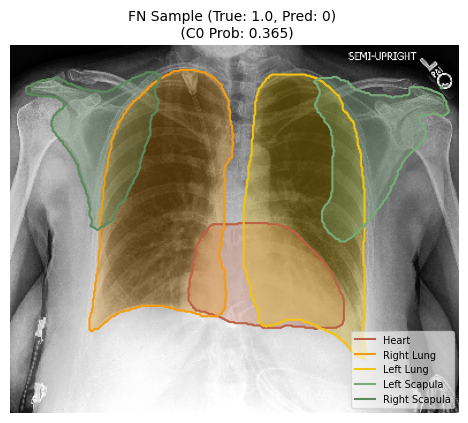

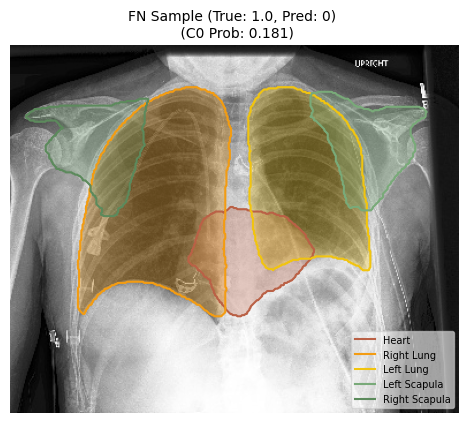

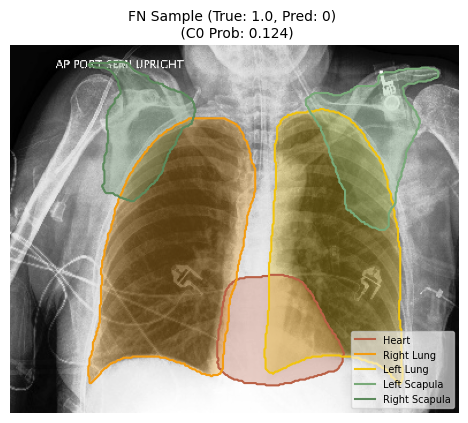

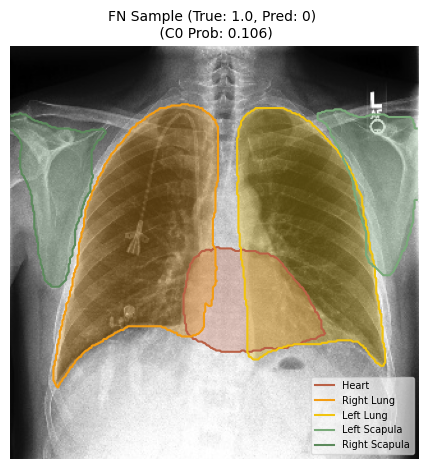

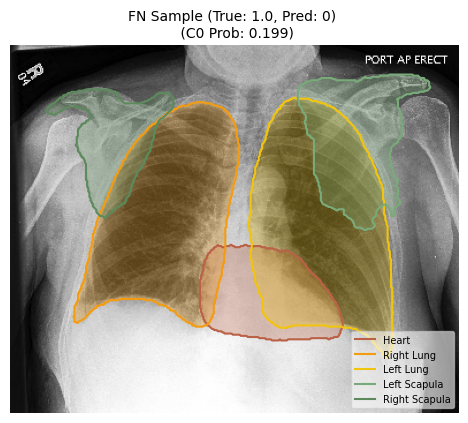

In [37]:
plot_sample_image(fn_samples[0], f'FN Sample (True: {fn_samples[0][f"{DISEASE}_true"]}, Pred: {fn_samples[0][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[0][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Lung', 'Left Scapula', 'Right Scapula'])
plot_sample_image(fn_samples[1], f'FN Sample (True: {fn_samples[1][f"{DISEASE}_true"]}, Pred: {fn_samples[1][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[1][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Lung', 'Left Scapula', 'Right Scapula'])
plot_sample_image(fn_samples[2], f'FN Sample (True: {fn_samples[2][f"{DISEASE}_true"]}, Pred: {fn_samples[2][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[2][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Lung', 'Left Scapula', 'Right Scapula'])
plot_sample_image(fn_samples[3], f'FN Sample (True: {fn_samples[3][f"{DISEASE}_true"]}, Pred: {fn_samples[3][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[3][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Lung', 'Left Scapula', 'Right Scapula'])
plot_sample_image(fn_samples[4], f'FN Sample (True: {fn_samples[4][f"{DISEASE}_true"]}, Pred: {fn_samples[4][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[4][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Lung', 'Left Scapula', 'Right Scapula'])


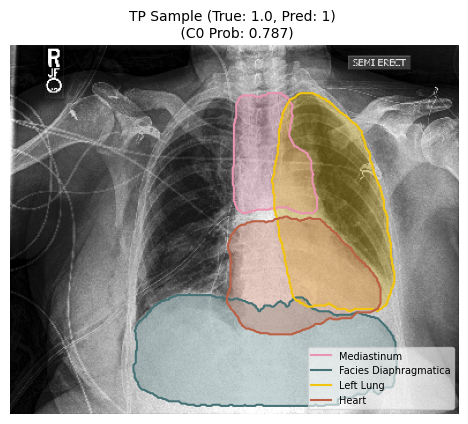

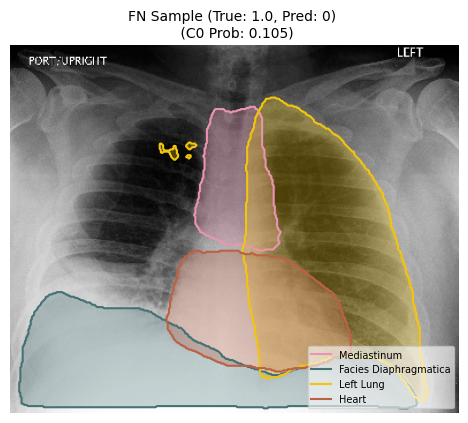

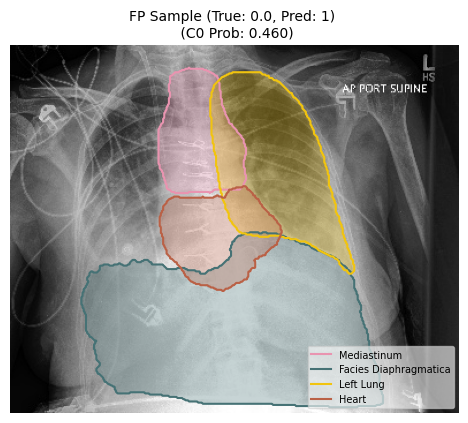

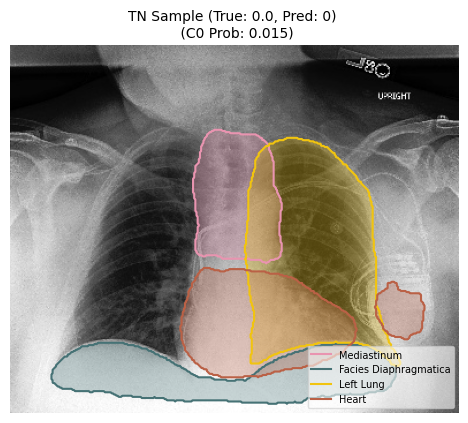

In [96]:
# Plot the 4 chosen samples
plot_sample_image(tp_samples[0], f'TP Sample (True: {tp_samples[0][f"{DISEASE}_true"]}, Pred: {tp_samples[0][f"{DISEASE}_pred"]}) \n (C0 Prob: {tp_samples[0][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])
plot_sample_image(fn_samples[0], f'FN Sample (True: {fn_samples[0][f"{DISEASE}_true"]}, Pred: {fn_samples[0][f"{DISEASE}_pred"]}) \n (C0 Prob: {fn_samples[0][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])
plot_sample_image(fp_samples[0], f'FP Sample (True: {fp_samples[0][f"{DISEASE}_true"]}, Pred: {fp_samples[0][f"{DISEASE}_pred"]}) \n (C0 Prob: {fp_samples[0][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])
plot_sample_image(tn_samples[0], f'TN Sample (True: {tn_samples[0][f"{DISEASE}_true"]}, Pred: {tn_samples[0][f"{DISEASE}_pred"]}) \n (C0 Prob: {tn_samples[0][f"{DISEASE}_prob"]:.3f})', overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])

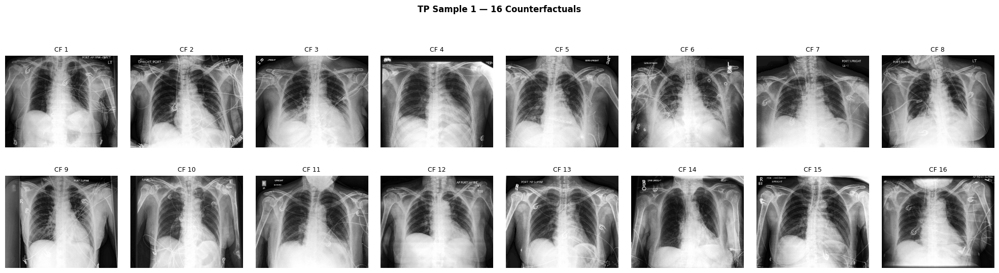

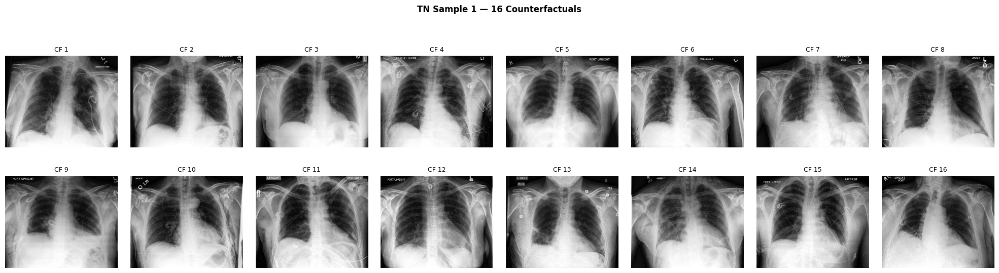

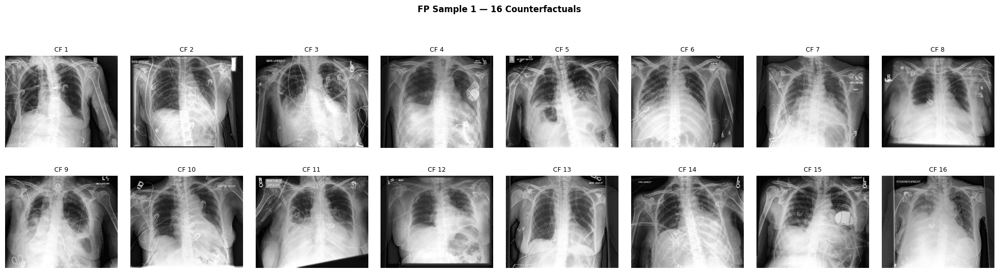

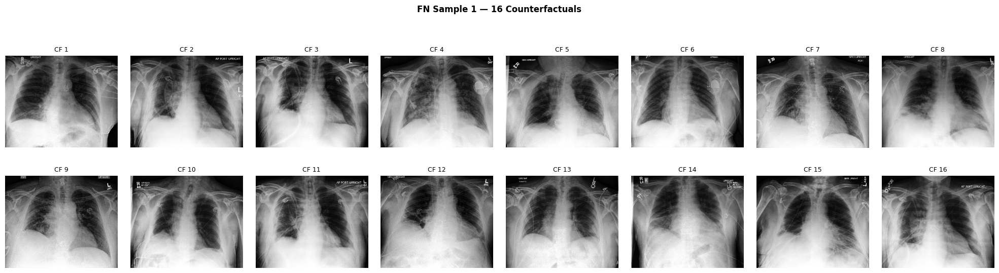

In [76]:
def plot_sample_cfs(sample_idx, quadrant_name, cf_paths_all, cfs_per_sample=16):
    """
    Plot the 16 CFs for a specific sample in a specific quadrant.
    
    Parameters
    ----------
    sample_idx : int
        Which sample (0-4 for your 5 samples per quadrant)
    quadrant_name : str
        "TP", "TN", "FP", or "FN"
    cf_paths_all : list of str
        The 80 CF paths for that quadrant
    cfs_per_sample : int
        Should be 16
    """
    start = sample_idx * cfs_per_sample
    end = start + cfs_per_sample
    cf_paths = cf_paths_all[start:end]
    
    fig, axes = plt.subplots(2, 8, figsize=(20, 6))
    axes = axes.flatten()

    for i, cf_path in enumerate(cf_paths):
        cf_img_np = load_image_gray(str(cf_path))
        axes[i].imshow(cf_img_np, cmap='gray')
        axes[i].set_title(f"CF {i+1}", fontsize=9)
        axes[i].axis('off')

    plt.suptitle(f"{quadrant_name} Sample {sample_idx+1} — 16 Counterfactuals", fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_sample_cfs(0, "TP", true_positive_sample_cf_paths)
plot_sample_cfs(0, "TN", true_negative_sample_cf_paths)
plot_sample_cfs(0, "FP", false_positive_sample_cf_paths)
plot_sample_cfs(0, "FN", false_negative_sample_cf_paths)

In [77]:
print(f"TP CF paths count: {len(true_positive_sample_cf_paths)}")
print(f"TN CF paths count: {len(true_negative_sample_cf_paths)}")
print(f"FP CF paths count: {len(false_positive_sample_cf_paths)}")
print(f"FN CF paths count: {len(false_negative_sample_cf_paths)}")

TP CF paths count: 80
TN CF paths count: 80
FP CF paths count: 80
FN CF paths count: 80


In [81]:
def plot_kde_with_cf16(
    cf16_merged_data, cf1_merged_data,
    sample, sample_cf_paths,
    disease, threshold=0.5634,
    title = None
):
    positive = cf16_merged_data[cf16_merged_data[f'{disease}_true'] == 1]
    negative = cf16_merged_data[cf16_merged_data[f'{disease}_true'] == 0]

    kde_pos = gaussian_kde(positive[f'{disease}_prob'])
    kde_neg = gaussian_kde(negative[f'{disease}_prob'])

    sample_true = sample[f'{disease}_true']
    sample_prob = sample[f'{disease}_prob']

    # Get prob for each of the 16 CFs by looking up their path in cf16_merged_data
    cf_probs = []
    for cf_path in sample_cf_paths:
        row = cf16_merged_data[cf16_merged_data['path'] == cf_path]
        if not row.empty:
            cf_probs.append(row[f'{disease}_prob'].values[0])
    cf_probs = np.array(cf_probs)
    mean_cf_prob = cf_probs.mean()

    fig, ax = plt.subplots(figsize=(6, 6))

    sns.kdeplot(positive[f'{disease}_prob'], label='Positive (Effusion)',
                fill=True, alpha=0.5, color="#439e49", ax=ax)
    sns.kdeplot(negative[f'{disease}_prob'], label='Negative (No Effusion)',
                fill=True, alpha=0.5, color="#ba6146", ax=ax)

    ax.axvline(threshold, color='red', linestyle='--', label=f'Threshold = {threshold}')

    # Original sample — pick KDE based on ground truth
    sample_kde = kde_pos if sample_true == 1 else kde_neg
    sample_y = sample_kde(sample_prob)[0]
    ax.axvline(sample_prob, color='orange', linewidth=2,
               label=f'Sample (p={sample_prob:.3f})')
    ax.scatter(sample_prob, sample_y, color='orange', s=150, zorder=5)

    # 16 thin CF lines
    for i, cf_prob in enumerate(cf_probs):
        cf_true = sample_true  # CFs share the same ground truth class
        cf_kde = kde_pos if cf_true == 1 else kde_neg
        cf_y = cf_kde(cf_prob)[0]
        ax.axvline(cf_prob, color='purple',linestyle = '--',linewidth=0.6, alpha=0.4,
                   label='CFs' if i == 0 else None)
        ax.scatter(cf_prob, cf_y, color='purple', s=40, alpha=0.5, zorder=4)

    # Thick mean CF line
    mean_kde = kde_pos if sample_true == 1 else kde_neg
    mean_y = mean_kde(mean_cf_prob)[0]
    ax.axvline(mean_cf_prob, color='purple', linewidth=2.5,
               label=f'Mean CF (p={mean_cf_prob:.3f})')
    ax.scatter(mean_cf_prob, mean_y, color='purple', s=150, zorder=6, marker='*')

    ax.set_xlabel(f'Predicted Probability of {disease.capitalize()}')
    ax.set_ylabel('Density')
    ax.set_title(f'C0 distribution {title} \n(GT={sample_true}, p={sample_prob:.3f})')
    ax.legend()
    plt.tight_layout()
    plt.show()

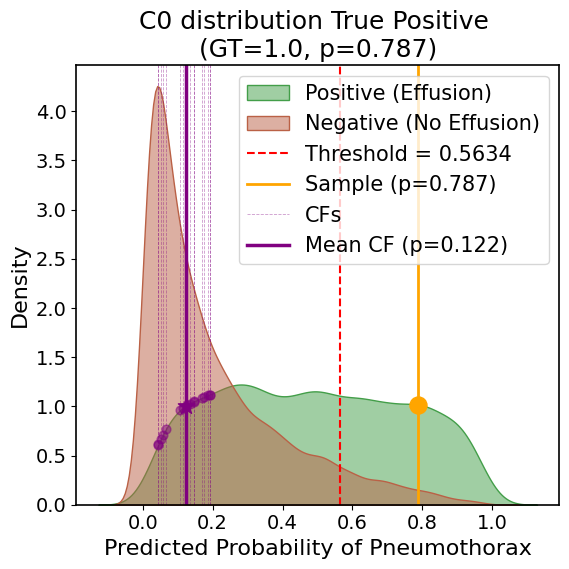

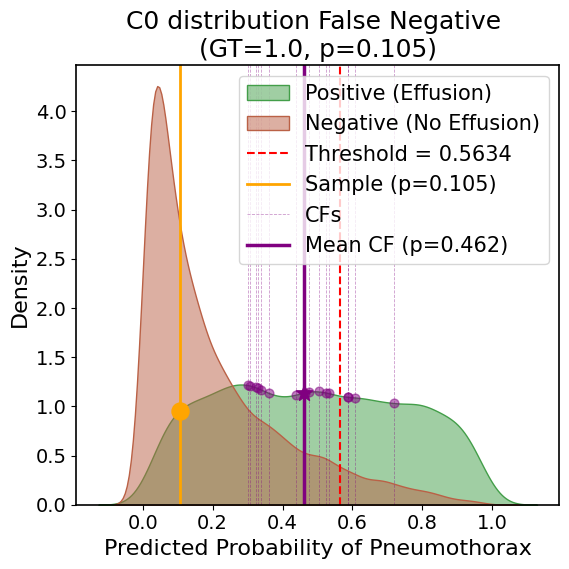

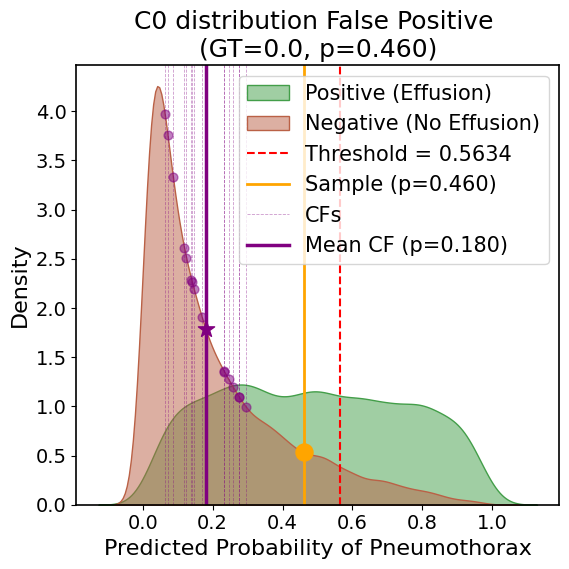

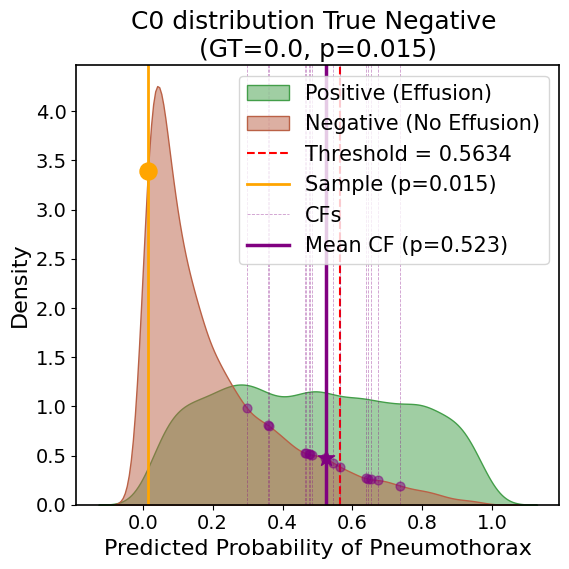

In [82]:
# Extract CFs for sample 0 only (indices 0:16)
tp_sample0_cfs = true_positive_sample_cf_paths[0:16]
tn_sample0_cfs = true_negative_sample_cf_paths[0:16]
fp_sample0_cfs = false_positive_sample_cf_paths[0:16]
fn_sample0_cfs = false_negative_sample_cf_paths[0:16]

# Now plot
plot_kde_with_cf16(cf16_merged_data, cf16_merged_data, tp_samples[0], tp_sample0_cfs, DISEASE, title="True Positive")
plot_kde_with_cf16(cf16_merged_data, cf16_merged_data, fn_samples[0], fn_sample0_cfs, DISEASE, title="False Negative")
plot_kde_with_cf16(cf16_merged_data, cf16_merged_data, fp_samples[0], fp_sample0_cfs, DISEASE, title="False Positive")
plot_kde_with_cf16(cf16_merged_data, cf16_merged_data, tn_samples[0], tn_sample0_cfs, DISEASE, title="True Negative")

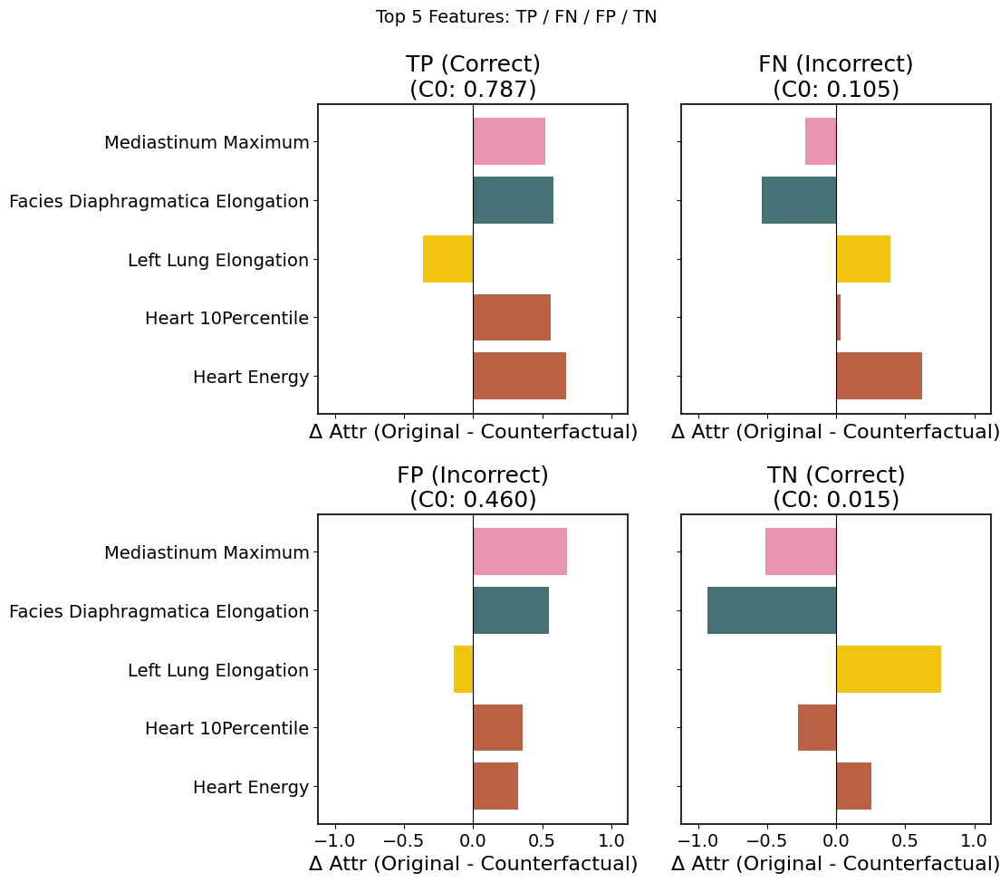

In [83]:
# ── 3. Clean names ─────────────────────────────────────────────────────────────
def clean_name(col):
    return (col
        .replace('delta_', '')
        .replace('_original_firstorder_', ' ')
        .replace('_original_shape2D_', ' ')
    )

short_names = [clean_name(c) for c in top5_cols]


fig, axes = plt.subplots(2, 2, figsize=(12, 10),sharex=True, sharey=True)
axes = axes.flatten()

tp_delta = tp_samples[0][top5_cols].values
fn_delta = fn_samples[0][top5_cols].values
fp_delta = fp_samples[0][top5_cols].values
tn_delta = tn_samples[0][top5_cols].values

samples = [
    (tp_delta, 'TP (Correct)',   tp_samples[0]),
    (fn_delta, 'FN (Incorrect)', fn_samples[0]),
    (fp_delta, 'FP (Incorrect)', fp_samples[0]),
    (tn_delta, 'TN (Correct)',   tn_samples[0]),
]

all_deltas = np.concatenate([tp_delta, fn_delta, fp_delta, tn_delta])
x_lim = max(abs(all_deltas.min()), abs(all_deltas.max())) * 1.2

for ax, (delta, label, sample) in zip(axes, samples):
    colors = [organ_colours(c) for c in top5_cols]
    ax.barh(short_names, delta, color=colors)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(f'{label}\n(C0: {sample[f"{DISEASE}_prob"]:.3f})')
    ax.set_xlabel('Δ Attr (Original - Counterfactual)')
    ax.set_xlim(-x_lim, x_lim)
    ax.set_aspect('auto')
    ax.set_box_aspect(1)  # makes each subplot square

plt.suptitle('Top 5 Features: TP / FN / FP / TN', fontsize=14)
plt.tight_layout()
plt.show()

In [84]:
def compute_global_xlim(all_sample_groups):
    all_deltas = np.concatenate([
        np.concatenate([s[top5_cols].values for s in samples])
        for samples in all_sample_groups
    ])
    return max(abs(all_deltas.min()), abs(all_deltas.max())) * 1.2


In [85]:
def plot_deltas_for_samples(samples, title, x_lim=None):
    fig, axes = plt.subplots(1, len(samples), figsize=(5 * len(samples), 5), sharey=True)
    
    if len(samples) == 1:
        axes = [axes]

    if x_lim is None:
        all_deltas = np.concatenate([s[top5_cols].values for s in samples])
        x_lim = max(abs(all_deltas.min()), abs(all_deltas.max())) * 1.2

    for ax, sample in zip(axes, samples):
        delta = sample[top5_cols].values
        colors = [organ_colours(c) for c in top5_cols]

        ax.barh(short_names, delta, color=colors)
        ax.axvline(0, color='black', linewidth=0.8)
        ax.set_title(f'C0: {sample[f"{DISEASE}_prob"]:.3f}')
        ax.set_xlabel('Δ Attr (Original - Counterfactual)')

        ax.set_xlim(-x_lim, x_lim)
        ax.set_aspect('auto')
        ax.set_box_aspect(1)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

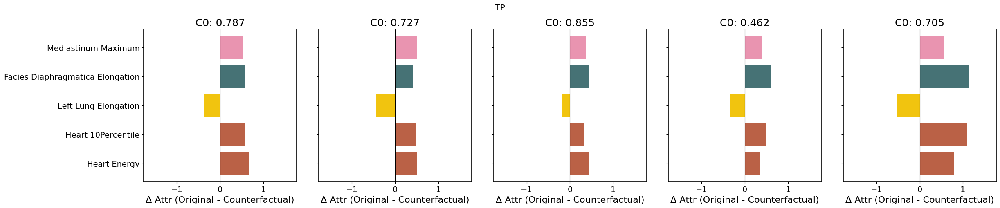

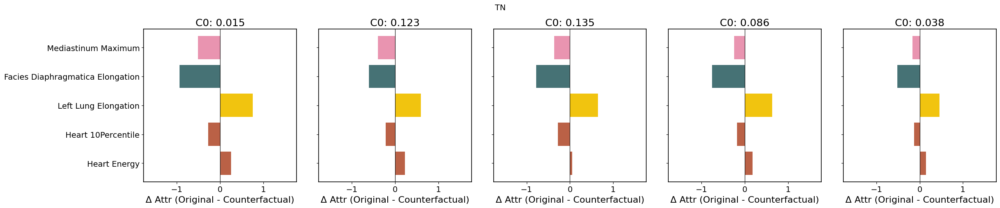

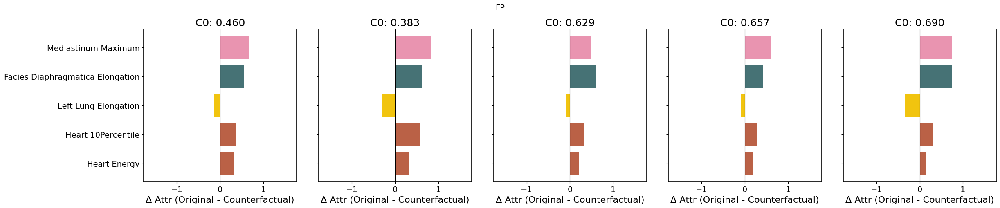

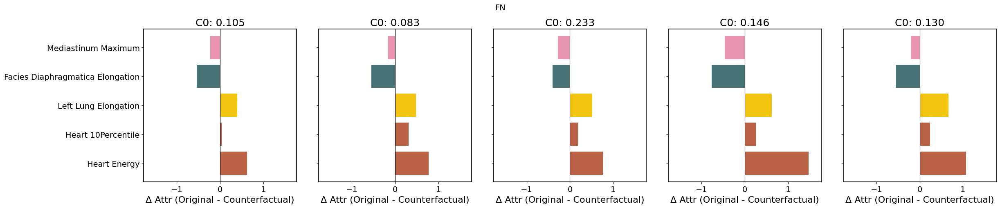

In [86]:
global_xlim = compute_global_xlim([
    tp_samples,
    fp_samples,
    fn_samples,
    tn_samples
])

plot_deltas_for_samples(tp_samples, "TP", x_lim=global_xlim)
plot_deltas_for_samples(tn_samples, "TN", x_lim=global_xlim)
plot_deltas_for_samples(fp_samples, "FP", x_lim=global_xlim)
plot_deltas_for_samples(fn_samples, "FN", x_lim=global_xlim)


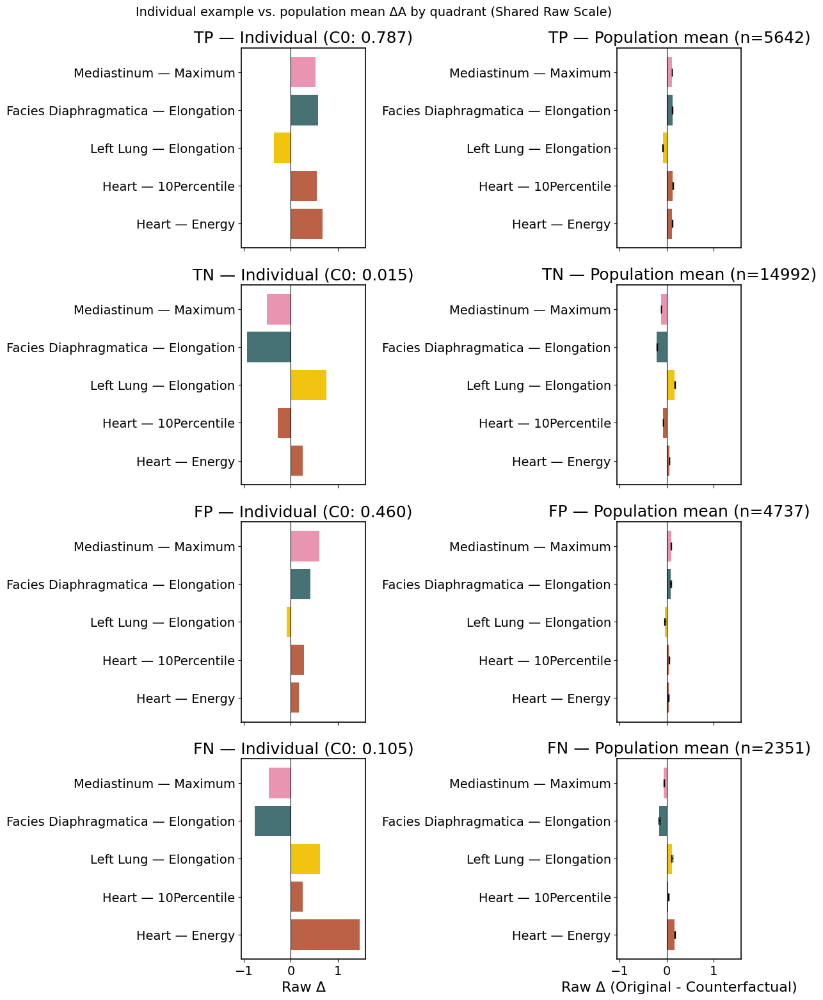

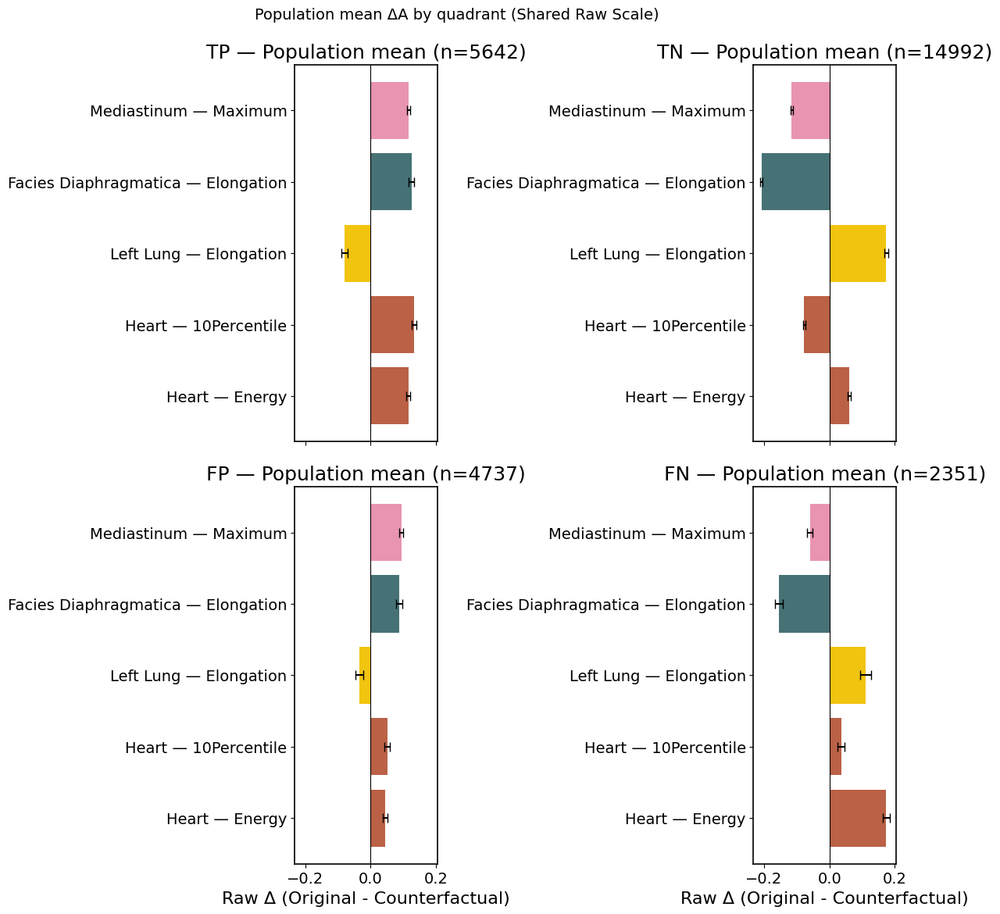

In [92]:

# Extract your exact delta values matching the selection
tp_delta = tp_samples[0][top5_cols].values
tn_delta = tn_samples[0][top5_cols].values
fp_delta = fp_samples[3][top5_cols].values
fn_delta = fn_samples[3][top5_cols].values

# 4. Global configurations for Plotting
def clean_name(col):
    s = col.replace('delta_', '')
    if 'original' not in s:
        parts = s.rsplit('_', 2)
        return f"{parts[0].replace('_',' ')} — {' '.join(parts[1:])}"
    organ, rest = s.split('_original_', 1)
    organ = organ.replace('_', ' ')
    stat  = rest.split('_', 1)[-1]
    return f"{organ} — {stat}"

short_names = [clean_name(c) for c in top5_cols]
colors = [organ_colours(c) for c in top5_cols]

pop_means = {q: cf16_merged_data[cf16_merged_data['quadrant'] == q][top5_cols].mean().values for q in ['TP', 'TN', 'FP', 'FN']}
pop_sems  = {q: cf16_merged_data[cf16_merged_data['quadrant'] == q][top5_cols].sem().values for q in ['TP', 'TN', 'FP', 'FN']}

samples = [
    ('TP', tp_delta, tp_samples[0]),
    ('TN', tn_delta, tn_samples[0]),
    ('FP', fp_delta, fp_samples[0]),
    ('FN', fn_delta, fn_samples[0]),
]

# 5. Build Grid Plot
fig, axes = plt.subplots(4, 2, figsize=(12, 16), sharex=True)

for row, (quad, delta, sample) in enumerate(samples):
    ax_ind = axes[row, 0]
    ax_pop = axes[row, 1]
    
    # Left Side: Representative Individual Case
    ax_ind.barh(short_names, delta, color=colors)
    ax_ind.axvline(0, color='black', linewidth=0.8)
    ax_ind.set_title(f'{quad} — Individual (C0: {sample[f"{DISEASE}_prob"]:.3f})')
    if row == 3:
        ax_ind.set_xlabel('Raw Δ')

    # Right Side: Entire Subpopulation Mean
    ax_pop.barh(short_names, pop_means[quad], xerr=pop_sems[quad], color=colors, capsize=4)
    ax_pop.axvline(0, color='black', linewidth=0.8)
    ax_pop.set_title(f'{quad} — Population mean (n={(cf16_merged_data["quadrant"] == quad).sum()})')
    if row == 3:
        ax_pop.set_xlabel('Raw Δ (Original - Counterfactual)')

plt.suptitle('Individual example vs. population mean ΔA by quadrant (Shared Raw Scale)', fontsize=14)
plt.tight_layout()
# save as png   
plt.savefig("deltaA_individual_vs_population.png", dpi=1200)
plt.show()

# separate plor, 2x2 with the population means only, with error bars
fig, axes = plt.subplots(2, 2, figsize=(12, 12), sharex=True)
quads = ['TP', 'TN', 'FP', 'FN']
for i, quad in enumerate(quads):
    ax = axes[i//2, i%2]
    ax.barh(short_names, pop_means[quad], xerr=pop_sems[quad], color=colors, capsize=4)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(f'{quad} — Population mean (n={(cf16_merged_data["quadrant"] == quad).sum()})')
    if i//2 == 1:
        ax.set_xlabel('Raw Δ (Original - Counterfactual)')  
plt.suptitle('Population mean ΔA by quadrant (Shared Raw Scale)', fontsize=14)
plt.tight_layout()
plt.show()

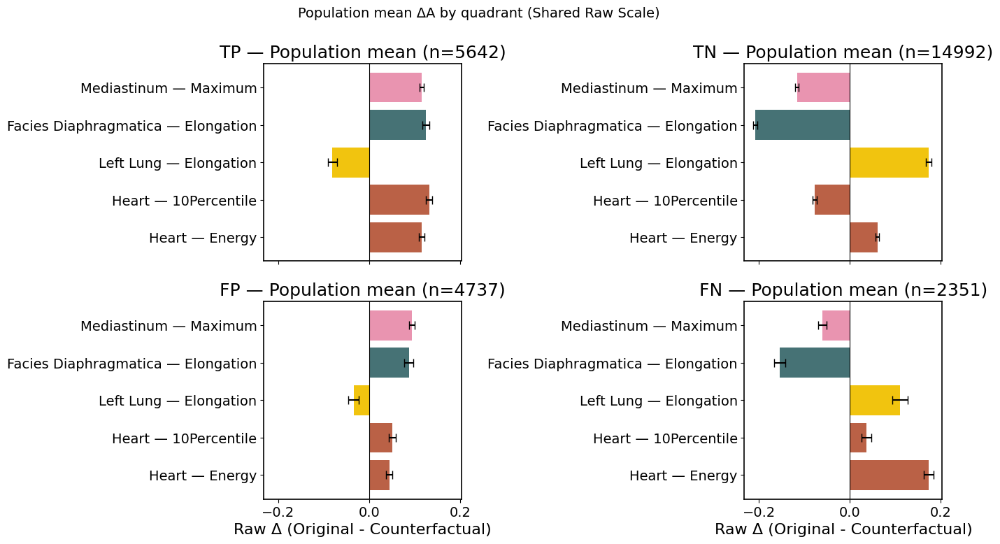

In [ ]:
# separate plor, 2x2 with the population means only, with error bars
fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex=True)
quads = ['TP', 'TN', 'FP', 'FN']
for i, quad in enumerate(quads):
    ax = axes[i//2, i%2]
    ax.barh(short_names, pop_means[quad], xerr=pop_sems[quad], color=colors, capsize=4)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(f'{quad} — Population mean (n={(cf16_merged_data["quadrant"] == quad).sum()})')
    if i//2 == 1:
        ax.set_xlabel('Raw Δ (Original - Counterfactual)')  
plt.suptitle('Population mean ΔA by quadrant (Shared Raw Scale)', fontsize=14)
plt.tight_layout()
plt.show()

In [93]:
def plot_avg_cf_image(cf_paths, title, overlay_organs=None):
    plt.close('all')
 
    # ── 1. Average image ───────────────────────────────────────────────────────´
    print(f"Loading and averaging {len(cf_paths)} counterfactual images...")
    ref = load_image_gray(cf_paths[0])
    target_h, target_w = ref.shape

    imgs = []
    for p in cf_paths:
        img = load_image_gray(p).astype(np.float32)
        if img.shape != (target_h, target_w):
            img = np.array(Image.fromarray(img.astype(np.uint8)).resize(
                (target_w, target_h), Image.BILINEAR
            )).astype(np.float32)
        imgs.append(img)

    avg_img = np.mean(imgs, axis=0).astype(np.uint8)

    print("Creating figure and axis...")
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))  # ← was missing
    ax.imshow(avg_img, cmap='gray')

    print(f"Overlaying segmentation for organs: {overlay_organs if overlay_organs else 'None'}")
    if overlay_organs is not None:
        organs_to_plot = seg_model.targets if overlay_organs == 'all' else overlay_organs
        colors = [organ_colours(organ) for organ in organs_to_plot]

        # ── 2. Average segmentation ────────────────────────────────────────────
        print("Running PSPNet on each CF image for segmentation...")
        seg_accumulator = None
        for cf_path in cf_paths:
            img_pil = Image.open(os.path.join(DATA_DIR, cf_path)).convert("L")
            img_np_norm = (np.array(img_pil).astype(np.float32) / 255.0) * 2048 - 1024
            img_tensor = torch.from_numpy(transform(img_np_norm[None])).unsqueeze(0).to(device)

            with torch.no_grad():
                seg_out = seg_model(img_tensor).cpu().numpy()
            seg_out = 1 / (1 + np.exp(-seg_out))

            if seg_accumulator is None:
                seg_accumulator = seg_out
            else:
                seg_accumulator += seg_out
        print("Averaging segmentation outputs...")
        avg_seg = seg_accumulator / len(cf_paths)

        # ── 3. Overlay ─────────────────────────────────────────────────────────
        print("Overlaying contours for each organ...")
        for i, organ in enumerate(organs_to_plot):
            if organ not in seg_model.targets:
                print(f"[WARN] '{organ}' not in seg_model.targets, skipping")
                continue
            idx = seg_model.targets.index(organ)
            mask = (avg_seg[0, idx] >= 0.5).astype(np.uint8)

            mask_resized = np.array(
                Image.fromarray(mask * 255).resize(
                    (avg_img.shape[1], avg_img.shape[0]), Image.NEAREST
                )
            ) > 0

            color = colors[i % len(colors)]
            ax.contour(mask_resized, levels=[0.5], colors=[color], linewidths=1.5)
            ax.contourf(mask_resized, levels=[0.5, 1], colors=[color], alpha=0.3)
            ax.plot([], [], color=color, label=organ, linewidth=1.5)

        ax.legend(fontsize=7, loc='lower right', framealpha=0.6)

    ax.set_title(title, fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [94]:
true_positive_sample_cf_paths

['CheXpert-v1.0-small/train/patient38125/study2/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient25305/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient46243/study4/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient03667/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient03877/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient38241/study6/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient18727/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient31545/study7/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient24358/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient14074/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient05077/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient44118/study4/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient04514/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient34161/study1/view1_frontal.jpg',
 'CheXpert-v1.0-small/train/patient35012/study1/

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


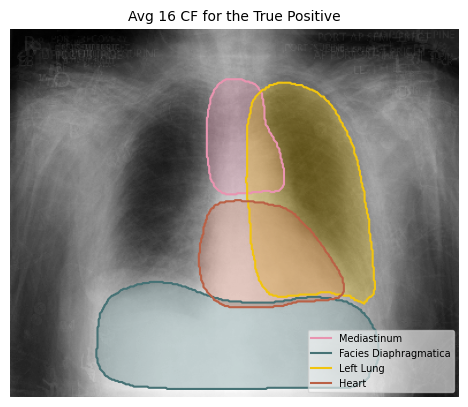

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


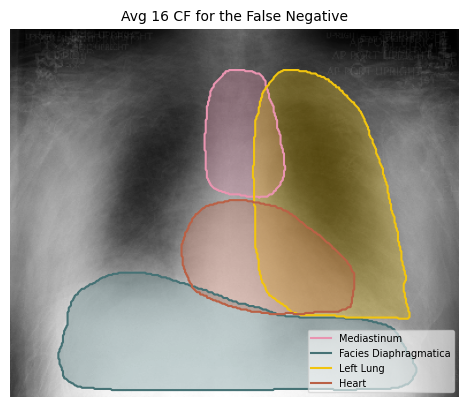

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


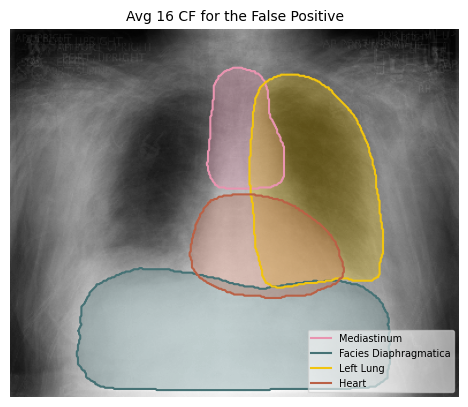

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


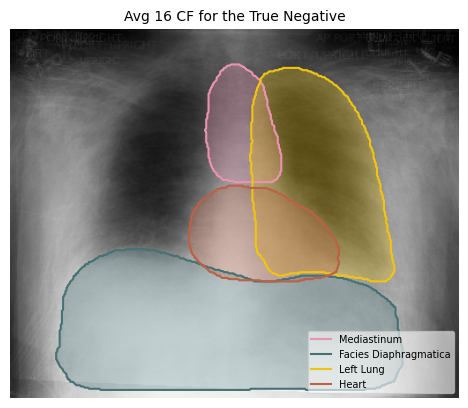

In [97]:
plot_avg_cf_image(
    true_positive_sample_cf_paths[0:16],
    title="Avg 16 CF for the True Positive",
    overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])
# now for the FN, TN, FP

plot_avg_cf_image(
    false_negative_sample_cf_paths[0:16],
    title="Avg 16 CF for the False Negative",
    overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])

# if the frist image cfs are 0:16 then the second image cfs should be 16:32, third 32:48, fourth 48:64, and fifth 64:80
plot_avg_cf_image(
    false_positive_sample_cf_paths[32:48],
    title="Avg 16 CF for the False Positive",
    overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])
plot_avg_cf_image(
    true_negative_sample_cf_paths[32:48],
    title="Avg 16 CF for the True Negative",
    overlay_organs=['Mediastinum', 'Facies Diaphragmatica', 'Left Lung', 'Heart'])

# Average across dataset